# **Stanford Dog Breeds Classification Using Transfer Learning** <br>

The process is as follows:
1. [Data Loading and Structure](#Data_loading_structure)
2. [Shuffle and Plot Images](#Shuffle_plot)
3. [Subset Data](#Subset_data)
4. [Encoding Data](#Encoding_data)
5. [Preparing Train, Validation & Test Data](#Preparing_data)
6. [Data Augmentation](#Data_augmentation)
7. [Model Building](#Model_building)
8. [Train Model](#Train_model)    
9. [Accuracy and Loss Plots](#Accuracy_loss_plots)
10. [Predicting on Test Set](#Predict_test)
11. [Model Evaluation Metrics](#Evaluation_metrics)
12. [Plot Predictions against Actual Labels](#Plot_predictions)
13. [Conclusions](#Conclusions)

<a id='Data_loading_structure'></a>
## **1. Data Loading and Structure** ##

We start by exploring the dataset to look at the classes/breeds of the dogs to understand more about its structure.

In [1]:
# Display the Folders/Classes
import numpy as np
import pandas as pd 
import os
from shutil import copyfile

print(os.listdir('Images/'))
dog_classes = os.listdir('Images/')

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

There are 120 subfolders, each belonging to 1 of the 120 dog breeds. For example, images of the Chow breed are under the subfolder *n02112137-chow*. 
We then proceed to extract the name of the dog breeds by splitting the folder name.

In [2]:
# Get the dog labels

breeds = [breed.split('-',1)[1] for breed in dog_classes] # get labels by splitting the folder name at dash
breeds[:10] # view some of the labels

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound']

Then, for each of the images, we get the full path to the image (stored in X), as well as its associated label/class/breed (stored in y). This allows us to load the images easily. 

In [3]:
# Get images full path and their labels

from itertools import chain

X = []
y = []

fullpaths = ['Images/{}'.format(dog_class) for dog_class in dog_classes]

for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append([fullpath + '/' + imgname])
        y.append(breeds[counter])

X = list(chain.from_iterable(X)) # unnest the lists and join together into one list

len(X) # number of pictures

20580

<a id='Shuffle_plot'></a>
## **2. Shuffle and Plot Images** ##

Here, we shuffle the images and their labels together so that they are not grouped by their breeds.

In [4]:
# Random shuffle the images for learning

import random

# shuffle X and y
combined = list(zip(X, y))
random.shuffle(combined)

X[:], y[:] = zip(*combined)

And look at a sample batch of the dog images with their associated labels. Notice that the images have different dimensions, so we will have to resize them later before putting them into the model.

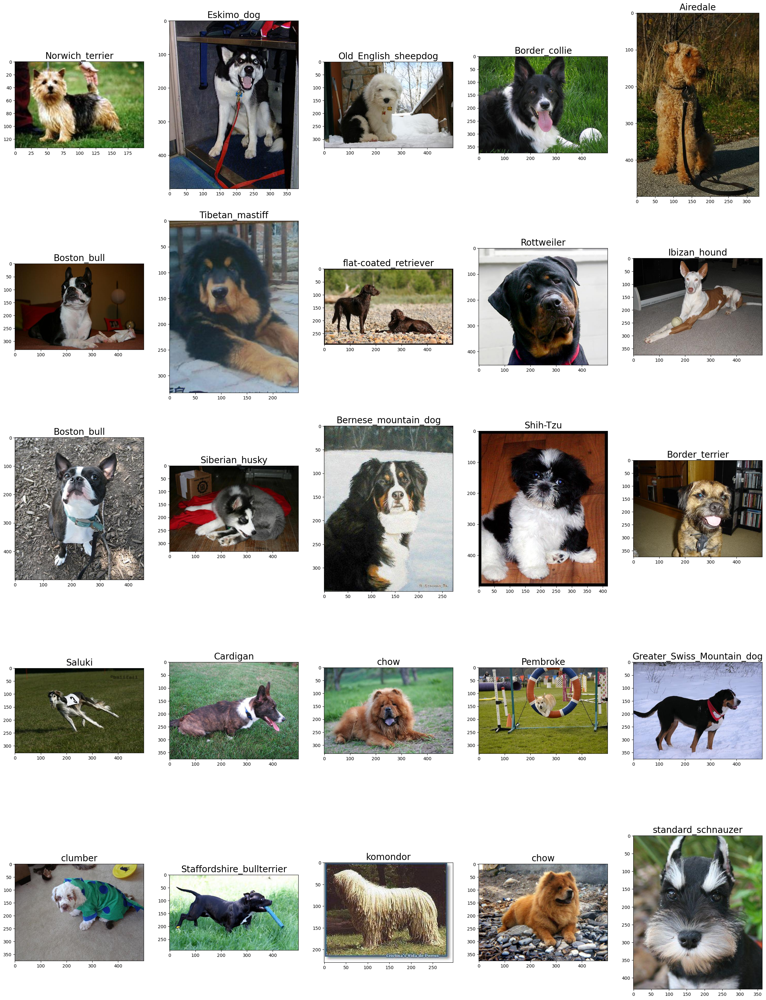

In [5]:
# Display random dogs pictures 

import matplotlib.pyplot as plt
%matplotlib inline 
from matplotlib.image import imread

plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(X)), 25)): # random 25 images
    plt.subplot(5, 5, counter+1)
    plt.subplots_adjust(hspace=0.1)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=20)

    
plt.show()

<a id='Subset_data'></a>
## **3. Subset Data** ##

The next step is not necessary if you have sufficient computational power. I am running this on a laptop with 8gb of RAM, so everytime the kernel RAM exceeds its memory quota, it shuts down. To deal with that, I subsetted a portion of the dataset. However, this will lower the model performance.

*Note: If you are facing this issue as well, proper memory management is highly recommended using the gc.collect() function. This involves deleting the unnecessary variables that you do not need anymore and clearing them from memory.*

In [6]:
# Choose a subset to test code

X = X[:8000]
y = y[:8000]

<a id='Encoding_data'></a>
## **4. Encoding Data** ##

It is also very important that we encode the classes/breeds. Here we will use one-hot encoding, so that for each image, there will be 120 columns, with all but 1 column with a value of 0. The only column with a value of 1 is the image's associated class/breed/label.

In [7]:
# Convert labels to one-hot encoded labels

from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Label and one-hot encoding y labels
le = LabelEncoder()
le.fit(y)
y_ohe = to_categorical(le.transform(y), len(breeds))
y_ohe = np.array(y_ohe)

<a id='Preparing_data'></a>
## **5. Preparing Train, Validation & Test Data** ##

Now it's time to prepare our training, validation and testing dataset. We do this using the *train_test_split* function from the *sklearn* module. But before that, we load the images to the same dimensions and convert them into an image array, each containing the rgb values of every pixel.

*Note: It's important to convert the images into a dimension that is similar to the ones that the pre-trained model is trained on.*

In [8]:
# Prepare train, validation and test data
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img

img_data = np.array([img_to_array(load_img(img, target_size = (299,299)))
                     for img in X]) # load, resize images, and store as array

x_train, x_test, y_train, y_test = train_test_split(img_data, y_ohe,
                                                   test_size = 0.2,
                                                   stratify=np.array(y), # stratify makes sure that proportion of each class in the output is same as the input
                                                   random_state = 2) 

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                 test_size = 0.2,
                                                 stratify=np.array(y_train),
                                                 random_state = 2)

print('Training Dataset Size: ', x_train.shape)
print('Validation Dataset Size: ', x_val.shape)
print('Testing Dataset Size: ', x_test.shape)
print('Training Label Size: ', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)


Training Dataset Size:  (5120, 299, 299, 3)
Validation Dataset Size:  (1280, 299, 299, 3)
Testing Dataset Size:  (1600, 299, 299, 3)
Training Label Size:  (5120, 120)
Validation Label Size:  (1280, 120)
Testing Label Size:  (1600, 120)


We can see that we have 2560 training, 640 validation,and 800 testing images. Each image has a 299x299 dimension, with 3 channels, representing the RGB channels.

<a id='Data_augmentation'></a>
## **6. Data Augmentation** ##
We also perform **data augmentation**, especially if we have a small dataset, to give us significantly more diverse data without collecting them. This works by applying some transformation to our images (e.g., rotation, axis flipping) to produce 'new' versions of existing images, thus giving us more data to train with.

In [9]:
# Data Augmentation

from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 32

# Create train generator
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, # only use rescale=1./255 if training from scratch
                                  rotation_range = 30,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  horizontal_flip = True) # CHECK

train_generator = train_datagen.flow(x_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input) # do not augment validation data

val_generator = val_datagen.flow(x_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)


Below is an example of an image that was transformed into 'new' images. The model can then extract features from them and learn that these features are associated with this particular breed of dog.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99575317..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994733..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99997604..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997409..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9956006..1.0].


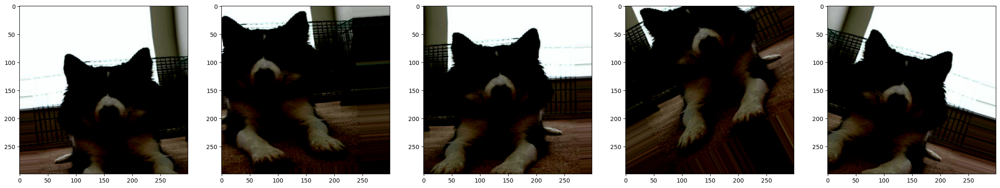

In [10]:
img_id = 20

dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                     shuffle = False, batch_size = batch_size, seed = 1)

plt.figure(figsize=(30,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs): 
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    #plt.axis('off')
    
plt.show()

<a id='Model_building'></a>
## **7. Model Building** ##

The next part is building the model. For this process, we are using Google's Inception V3 model. There are other models available to use in Keras as well. We remove the last layer of the Inception V3 model, and feed the output of it to our own set of layers, ending with a final *Dense* layer to classify or predict which of the 120 breeds the images belong to. We also freeze the initial Inception V3 model as it has already been trained before and compile the model.

In [12]:
# Build Model Using Pre-trained Model

from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

# load InceptionV3 pre-trained model
base_model = InceptionV3(weights = 'imagenet', include_top = False, input_shape = (299,299,3))

model = models.Sequential()
model.add(base_model) # add pre_trained layers
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(len(breeds), activation = 'softmax'))


# Freeze pre-trained layers
print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
model.layers[0].trainable = False
print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

Number of trainable weights before freezing the base layer: 194
Number of trainable weights after freezing the base layer: 6


In [13]:
# Compile the Model

model.compile(Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy']) 
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 8, 8, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 120)            │        61,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,176,088 (88.41 MB)

 Trainable params: 1,373,304 (5.24 MB)

 Non-trainable params: 21,802,784 (83.17 MB)


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
!pip install pydot
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) for `plot_model` to work.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


<a id='Train_model'></a>
## **8. Train Model** ##

It's finally time to train our model. The batch size is the number of images passed to the model for training during every iteration. Therefore, the number of iterations/steps is the number of images divided by the batch size, which constitues one epoch. After each iteration, weights of the nodes will be updated. An epoch ends when the entire dataset has been passed through. The more epoch we have, the more the model will train on the data.

In [21]:
# Train Model

train_steps_per_epoch = x_train.shape[0] // batch_size
val_steps_per_epoch = x_val.shape[0] // batch_size
epochs = 20

history = model.fit(train_generator,
                             steps_per_epoch = train_steps_per_epoch,
                             validation_data = val_generator,
                             validation_steps = val_steps_per_epoch,
                             epochs = epochs, verbose = 1)

model.save('dog_breed_classifier_model_via_inceptionv3.h5')

c:\Users\tiyob\Desktop\YaYa_Wallet\virt\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 309s 2s/step - accuracy: 0.0900 - loss: 4.5433 - val_accuracy: 0.6961 - val_loss: 2.6247
Epoch 2/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 296s 2s/step - accuracy: 0.6478 - loss: 2.2001 - val_accuracy: 0.8398 - val_loss: 0.7909
Epoch 3/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 290s 2s/step - accuracy: 0.7744 - loss: 0.9766 - val_accuracy: 0.8656 - val_loss: 0.5145
Epoch 4/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 289s 2s/step - accuracy: 0.8206 - loss: 0.6834 - val_accuracy: 0.8773 - val_loss: 0.4367
Epoch 5/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 290s 2s/step - accuracy: 0.8285 - loss: 0.6105 - val_accuracy: 0.8781 - val_loss: 0.4149
Epoch 6/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 290s 2s/step - accuracy: 0.8437 - loss: 0.5549 - val_accuracy: 0.8820 - val_loss: 0.3802
Epoch 7/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 316s 2s/step - accuracy: 0.8515 - loss: 0.4952 - val_accuracy: 0.8859 - val_loss: 0.3722
Epoch 8/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 393s 2s/step - accuracy: 0.8448 - loss: 0.4821 - val_accu

<a id='Accuracy_loss_plots'></a>
## **9. Accuracy and Loss Plots** ##

We made plots of the accuracy and loss for the training and validation data. This gives us an idea of how our model is performing (e.g., underfitting, overfitting).

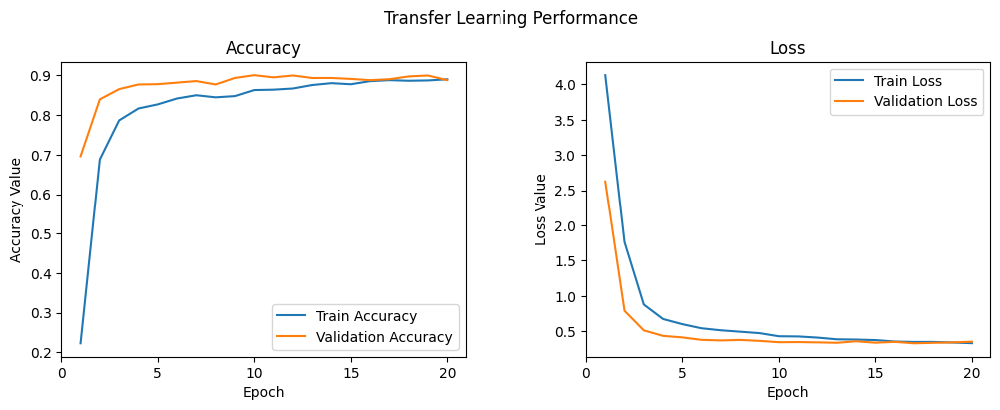

In [22]:
# Plot Accuracy and Loss 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Transfer Learning Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

<a id='Predict_test'></a>
## **10. Predicting on Test Set** ##

We then apply our model to a dataset that it has not seen before. This is important, as we want a model that can generalize to other datasets other than what it is trained on. A model that only does well on the training and validation dataset but not on a testing dataset is not a useful one.

In [23]:
# Evaluate Model on Test Data

x_test1 = x_test / 255. # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = model.predict(x_test1)

# get model predictions
predictions = le.classes_[np.argmax(test_predictions,axis=1)] # get labels and reverse back to get the text labels
# get target labels
target_labels = le.classes_[np.argmax(y_test,axis=1)]

# Store in dataframe
predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)


50/50 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step


,Target_Labels,Predictions
0,otterhound,otterhound
1,Chihuahua,Chihuahua
2,Sealyham_terrier,Sealyham_terrier
3,Leonberg,Leonberg
4,basset,basset
5,collie,Border_collie
6,American_Staffordshire_terrier,American_Staffordshire_terrier
7,Pomeranian,Pomeranian
8,Rhodesian_ridgeback,vizsla
9,Irish_wolfhound,Irish_wolfhound


We store the correct labels and predictions into a dataframe. The first few cases showed that our model did pretty alright with the predictions.

<a id='Evaluation_metrics'></a>
## **11. Model Evaluation Metrics** ##

Next, we get a measure of how well our model is performing by calculating the accuracy of the predictions against the actual target_labels.

In [24]:
# Get accuracy of measure

correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
print(accuracy)

0.88125


A better way is to calculate the precision, recall and F1 score of the classification in addition to accuracy. Looking at the combination of these model evaluation metrics will always give us a better idea of our model performance.

In [33]:
from sklearn import metrics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.base import clone
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc 


def get_metrics(true_labels, predicted_labels):
    
    print('Accuracy:', np.round(
                        metrics.accuracy_score(true_labels, 
                                               predicted_labels),
                        4))
    print('Precision:', np.round(
                        metrics.precision_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('Recall:', np.round(
                        metrics.recall_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('F1 Score:', np.round(
                        metrics.f1_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
                        

def train_predict_model(classifier, 
                        train_features, train_labels, 
                        test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    return predictions    


def display_confusion_matrix(true_labels, predicted_labels, classes=[1,0]):
    
    total_classes = len(classes)
    level_labels = [total_classes*[0], list(range(total_classes))]

    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels, 
                                  labels=classes)
    cm_frame = pd.DataFrame(data=cm, 
                            columns=pd.MultiIndex(levels=[['Predicted:'], classes], 
                                                  codes=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], classes], 
                                                codes=level_labels)) 
    return cm_frame
    
def display_classification_report(true_labels, predicted_labels, classes=[1,0]):

    report = metrics.classification_report(y_true=true_labels, 
                                           y_pred=predicted_labels, 
                                           labels=classes) 
    print(report)
    
    
    
def display_model_performance_metrics(true_labels, predicted_labels, classes=[1,0]):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, 
                                  classes=classes)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, 
                             classes=classes)


def plot_model_decision_surface(clf, train_features, train_labels,
                                plot_step=0.02, cmap=plt.cm.RdYlBu,
                                markers=None, alphas=None, colors=None):
    
    if train_features.shape[1] != 2:
        raise ValueError("X_train should have exactly 2 columnns!")
    
    x_min, x_max = train_features[:, 0].min() - plot_step, train_features[:, 0].max() + plot_step
    y_min, y_max = train_features[:, 1].min() - plot_step, train_features[:, 1].max() + plot_step
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    clf_est = clone(clf)
    clf_est.fit(train_features,train_labels)
    if hasattr(clf_est, 'predict_proba'):
        Z = clf_est.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1]
    else:
        Z = clf_est.predict(np.c_[xx.ravel(), yy.ravel()])    
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=cmap)
    
    le = LabelEncoder()
    y_enc = le.fit_transform(train_labels)
    n_classes = len(le.classes_)
    plot_colors = ''.join(colors) if colors else [None] * n_classes
    label_names = le.classes_
    markers = markers if markers else [None] * n_classes
    alphas = alphas if alphas else [None] * n_classes
    for i, color in zip(range(n_classes), plot_colors):
        idx = np.where(y_enc == i)
        plt.scatter(train_features[idx, 0], train_features[idx, 1], c=color,
                    label=label_names[i], cmap=cmap, edgecolors='black', 
                    marker=markers[i], alpha=alphas[i])
    plt.legend()
    plt.show()


def plot_model_roc_curve(clf, features, true_labels, label_encoder=None, class_names=None):
    
    ## Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    if hasattr(clf, 'classes_'):
        class_labels = clf.classes_
    elif label_encoder:
        class_labels = label_encoder.classes_
    elif class_names:
        class_labels = class_names
    else:
        raise ValueError('Unable to derive prediction classes, please specify class_names!')
    n_classes = len(class_labels)
    y_test = label_binarize(true_labels, classes=class_labels)
    if n_classes == 2:
        if hasattr(clf, 'predict_proba'):
            prob = clf.predict_proba(features)
            y_score = prob[:, prob.shape[1]-1] 
        elif hasattr(clf, 'decision_function'):
            prob = clf.decision_function(features)
            y_score = prob[:, prob.shape[1]-1]
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
        
        fpr, tpr, _ = roc_curve(y_test, y_score)      
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='ROC curve (area = {0:0.2f})'
                                 ''.format(roc_auc),
                 linewidth=2.5)
        
    elif n_classes > 2:
        if hasattr(clf, 'predict_proba'):
            y_score = clf.predict_proba(features)
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")

        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        ## Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        ## Compute macro-average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        # Finally average it and compute AUC
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        ## Plot ROC curves
        plt.figure(figsize=(6, 4))
        plt.plot(fpr["micro"], tpr["micro"],
                 label='micro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["micro"]), linewidth=3)

        plt.plot(fpr["macro"], tpr["macro"],
                 label='macro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["macro"]), linewidth=3)

        for i, label in enumerate(class_labels):
            plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'
                                           ''.format(label, roc_auc[i]), 
                     linewidth=2, linestyle=':')
    else:
        raise ValueError('Number of classes should be atleast 2 or more')
        
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

In [34]:
# Evaluate Model Performance
get_metrics(true_labels=target_labels,
            predicted_labels=predictions)

Accuracy: 0.8812
Precision: 0.8971
Recall: 0.8812
F1 Score: 0.8771


In [35]:
display_confusion_matrix(true_labels=target_labels, predicted_labels=predictions,  classes=breeds)

                            Predicted:                                        \
                             Chihuahua Japanese_spaniel Maltese_dog Pekinese   
Actual: Chihuahua                   12                0           0        0   
        Japanese_spaniel             0               10           0        0   
        Maltese_dog                  0                0          18        0   
        Pekinese                     0                0           0        9   
        Shih-Tzu                     0                0           0        0   
...                                ...              ...         ...      ...   
        standard_poodle              0                0           0        0   
        Mexican_hairless             1                0           0        0   
        dingo                        0                0           0        0   
        dhole                        0                0           0        0   
        African_hunting_dog          0  

<a id='Plot_predictions'></a>
## **12. Plot Predictions against Actual Labels** ##

To better visualize our prediction performance, we plot out a small batch of our testing dataset, together with their actual labels, predictions as well as the probability values that our model predict they are in the category.

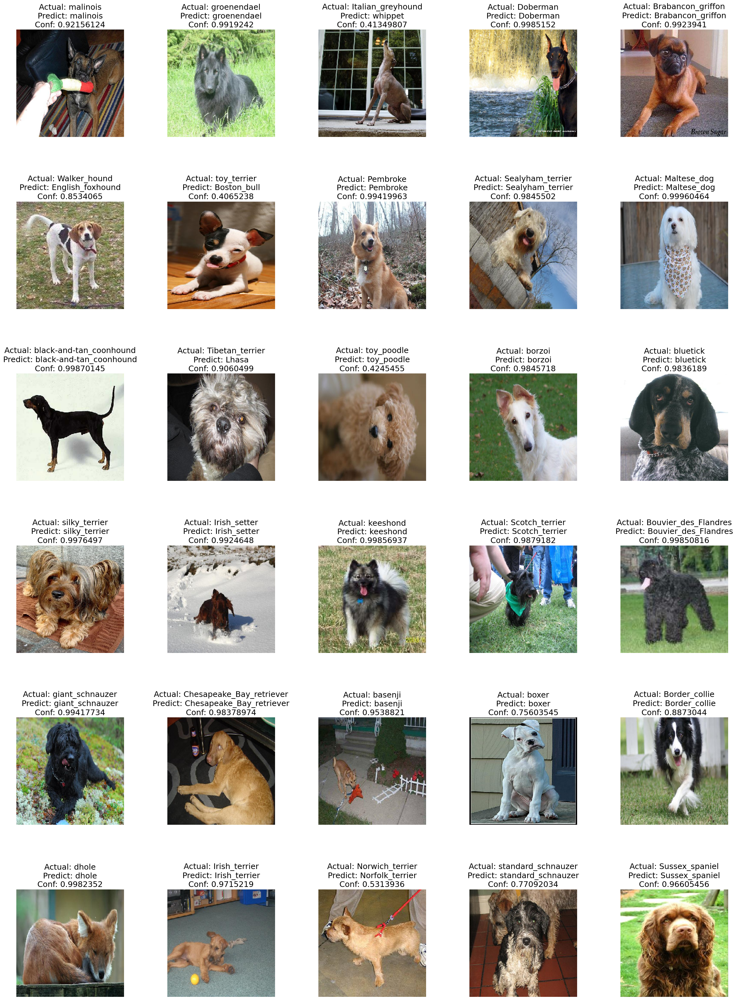

In [25]:
# Plot Actual vs Predicted Images with Confidence Levels
    
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)
    
plt.show()

<a id='Conclusions'></a>
## **13. Conclusions** ##

I believe that our model did pretty good on the testing dataset with ~86% prediction rate, considering that we only trained it on around 2560 images. This again shows the power of transfer learning. Training on more images will definitely increase the performance. However, I am still trying to figure out a way to store more images in arrays without it showing an error. I am not sure if this is a Kaggle limitation or my computer. Let me know if you have any insights!

Machine learning is an iterative process, with lots of trial and error to improve our model. We might try to optimize our models by tuning the parameters of the model such as the number of layers in the network, the number of nodes, the learning rate etc. Go try it out for yourselves--train some models for deep learning!